![MADE](images/made.jpg)

# Академия MADE

## Курс "Компьютерное зрение"

### Семинар 5: Реализация Single-shot Object Detection на примере RetinaNet

Сегодня мы рассмотрим реализацию архитектуры RetinaNet для детектирования объектов за один проход.

#### Материалы для чтения:
1. Оригинальная статья про RetinaNet: [Focal Loss for Dense Object Detection](https://arxiv.org/pdf/1708.02002.pdf)
2. Статья о подходе FPN: [Feature Pyramid Networks for Object Detection](https://arxiv.org/pdf/1612.03144.pdf)
3. Источник кода для семинара: [github/yhenon/pytorch-retinanet](https://github.com/yhenon/pytorch-retinanet)
4. Пост [RetinaNet Explained and Demystified](https://blog.zenggyu.com/en/post/2018-12-05/retinanet-explained-and-demystified/)

#### План
1. (Recap) Подходы к детектированию
2. Реализация компонентов RetinaNet
3. Дообучение RetinaNet

### 1. (Recap) Подходы к детектированию

#### Region-based

* Детектирование на основе регионов (region-based): 
  * Отдельная голова для предсказания возможных областей с объектами (Region Proposal Network, RPN)
  * Отдельные головы для классификации и уточнения границ регионов 
  * Все головы работают поверх признаков, извлеченных "базовой" моделью (она же *backbone*, она же *ствол* и т.д.)
  * Полученные прямоугольники объектов фильтруются с помощью процедуры *Non-maxima suppression (NMS)*
  * Пример: [Faster R-CNN](https://arxiv.org/pdf/1506.01497.pdf) (из семейства R-CNN):
      * Признаки вычисляются один раз и являются "общими" для всех ветвей
      * Голова RPN получает на вход кропы, заданные набором "якорных" прямоугольников (они же *anchor boxes*, *default boxes*, *proposals*, ...)
      * Для каждого кропа предсказывается вероятность содержания в нем объекта и уточняющие координаты границ
      * Отобранные якорные прямоугольники поступают на вход ветвей классификации и регрессии
  
      ![faster_rcnn](images/faster.png)

#### Single shot

* Детектирование "в один проход" (single-shot):
  * Идея с якорными прямоугольниками остается
  * Фактически, перенесли головы для классификации и регресии сразу внутрь RPN
  * Предсказания классов и уточняющих координат производится сразу для всех якорей
  * Пример: [Single Shot Multibox Detector](https://arxiv.org/pdf/1512.02325.pdf)
    * Предсказания собираются с разных глубин базовой сети
    
    ![ssd](images/ssd.png)

#### RetinaNet:

Ключевые особенности RetinaNet:
* Использование специальной функции потерь (*Focal Loss*) 
  * для борьбы с дисбалансом классов при обучении (обычно "объектов" на изображении меньше, чем "фона")
* Комбинирование признаков с разных глубин сети  (*Features Pyramid*) 
  * для "уравнивания" семантической силы нейронов на разных масштабах

### 2. Реализация компонентов RetinaNet

In [ ]:
!pip install -r requirements.txt

In [1]:
import os
import sys
import cv2
import json
import matplotlib.pyplot as plt

import numpy as np
import torch
from torch import nn
from torchvision.transforms.functional import to_tensor, normalize

device = "cuda" if torch.cuda.is_available() else "cpu"
print("Device is:", device)


from visualization import show_image, draw_predictions

Device is: cpu


Подгрузим тестовое изображение и сделаем из него батч размера 1. Это пригодится нам для демонстрации работы отдельных компонентов модели.

In [2]:
def make_tensor(image, device=None):
    tensor = to_tensor(image).unsqueeze(0)
    tensor = normalize(tensor,
                       mean=(0.485, 0.456, 0.406),
                       std=(0.229, 0.224, 0.225))
    if device:
        tensor = tensor.to(device)
    return tensor

Image shape (540, 800, 3)
Tensor size torch.Size([1, 3, 540, 800])


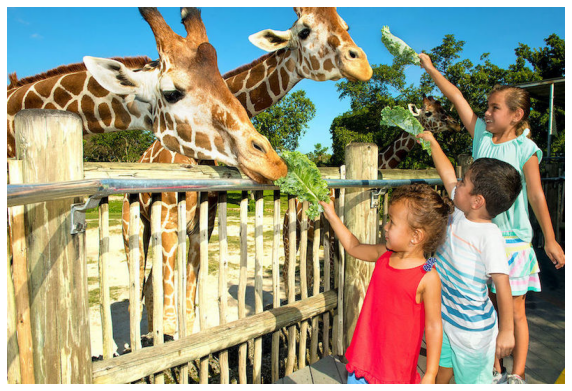

In [3]:
image_example = cv2.imread("images/zoo.jpg")


image_example = cv2.cvtColor(image_example, cv2.COLOR_BGR2RGB)
print("Image shape", image_example.shape)

tensor_example = make_tensor(image_example, device)
print("Tensor size", tensor_example.size())

show_image(image_example)

---

Поскольку модель имеет несколько отдельных модулей, реализуем их и положим в один композиционный класс:

- `RetinaNet`
  - `.backbone` - нейросеть для извлечения признаков; модифицированный `ResNet`, возвращающий карты активаций (вместо логитов);
  - `.fpn` - нейросеть для построения пирамиды признаков из выходов `.backbone`;
  - `.anchor_generator` - класс для построения наборов "якорных" боксов (anchors), на основе которых будет производится поиск объектов;
  - `.cls_head` - нейросеть для классификации каждого из anchor boxes;
  - `.reg_head` - нейросеть для регрессии уточняющих коэффициентов координат каждого из anchor boxes;
  - `.focal_loss` - реализация лосс-функции (да, ее можно поместить прямо в модель).

---

#### Backbone: Модифицированный ResNet

ResNet - семейство архитектур, у которого главная вычислительная единица - это т.н. residual-block:

![residuals](images/residual.png)

Модели `ResNet-*` состоят из блоков, объединенных в четыре слоя (`layerX`); между слоями происходит 1) понижение размерности HW и 2) увеличение "ширины" блоков (число каналов в картах).

**NB: картинка ниже - для сети ResNet-34, в которой используются "простые" all-3x3 residual-блоки, как на картинке выше слева. В ResNet-50 используются `bottleneck`-блоки (соответственно сверху справа).
Число слоев у этих моделей одинаковое (а вот число блоков в слоях и их ширина отличаются).**

![resnet34](images/resnet34.png)

Обычно (для задач типа классификации или регрессии) на выходе модели оказывается вектор (размера `C` = числу классов или 1 - для регрессии).
Но для задачи детектирования понадобятся промежуточные карты активаций, на основе который будет построена пирамида. 
На рисунке выше указаны карты `C3`, `C4` и `C5` - их и должен вернуть метод `.forward` нашей базовой сети.

**Задание**: реализовать метод `.forward()`, который должен возвращать карты активаций после слоев `layer2`, `layer3`, `layer4` в виде списка/кортежа.

In [7]:
from retinanet.utils import BasicBlock, Bottleneck  # See code

class ResNet(nn.Module):

    def __init__(self, num_classes, block, layers_sizes):
        """
        ResNet constructor.
        
        Args:
            - num_classes: int number of outputs for model.
            - block: class to use as residual block in model (BasicBlock or Bottleneck).
            - layers_sizes: list of sizes (number of blocks) for each of the 4 layers.
        """
        self.inplanes = 64
        super(ResNet, self).__init__()
        
        # Input convolution: larger (7x7) and with increased stride (2).
        self.conv1 = nn.Conv2d(3, 64, kernel_size=7, stride=2, padding=3, bias=False)
        self.bn1 = nn.BatchNorm2d(64)
        self.relu = nn.ReLU(inplace=True)
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
        
        # Four layers with residual blocks. Each layer has similar structure
        self.layer1 = self._make_layer(block, 64, layers_sizes[0])
        self.layer2 = self._make_layer(block, 128, layers_sizes[1], stride=2)
        self.layer3 = self._make_layer(block, 256, layers_sizes[2], stride=2)
        self.layer4 = self._make_layer(block, 512, layers_sizes[3], stride=2)
        
    def _make_layer(self, block, planes, num_blocks, stride=1):
        """
        Method to create layer for ResNet using residual blocks.
        
        Args:
            - block: class to use as residual block in model (BasicBlock or Bottleneck).
            - planes: number of channels in layer's activation maps (also known as layer 'width').
            - num_blocks: number of blocks in layer.
            
        Returns:
            nn.Sequential object containing residual blocks.
        """
        downsample = None
        if stride != 1 or self.inplanes != planes * block.expansion:
            downsample = nn.Sequential(
                nn.Conv2d(self.inplanes, planes * block.expansion,
                          kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(planes * block.expansion),
            )

        layers = [block(self.inplanes, planes, stride, downsample)]
        self.inplanes = planes * block.expansion
        for i in range(1, num_blocks):
            layers.append(block(self.inplanes, planes))

        return nn.Sequential(*layers)
    
    def forward(self, inputs):
        """
        Method for "__call__".
        
        Args:
            - inputs: batch of images shaped Bx3xHxW.
            
        Returns:
            List of feature maps tensors from layers 2, 3, 4.
        """
        
        # TODO: 
        # Write code to run all the model layers (do not forget to run input convolution/bn/activation/pooling) 
        # and to return feature maps from layer2, layer3, layer4.
        
        ### YOUR CODE HERE
        x0 = self.relu(self.bn1(self.conv1(inputs)))
        x0  = self.maxpool(x0)
        
        x1 = self.layer1(x0)
        x2 = self.layer2(x1)
        x3 = self.layer3(x2)
        x4 = self.layer4(x3)
        ### END OF YOUR CODE
        
        return (x2, x3, x4)

In [8]:
num_classes = 80

print("ResNet50:")
resnet50_layers_sizes = [3, 4, 6, 3]      
resnet50 = ResNet(num_classes=num_classes, block=Bottleneck, layers_sizes=resnet50_layers_sizes).to(device)

print(resnet50)

ResNet50:
ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), s

In [9]:
print("Feature maps sizes from layer2-4 of ResNet50:")
feature_maps_example = resnet50(tensor_example)
for fm in feature_maps_example:
    print(fm.size())

Feature maps sizes from layer2-4 of ResNet50:
torch.Size([1, 512, 68, 100])
torch.Size([1, 1024, 34, 50])
torch.Size([1, 2048, 17, 25])


---

#### Feature Pyramid: собираем пирамиду активаций

Теперь перейдем к модулю, который сделает из последовательности карт активаций пирамиду.

Идея `Feature Pyramid` в том, чтобы, скомбинировав карты с разных слоев основной сети (`backbone`), получить карты одновременно "семантически богатые" и с большим рецептивным полем.

![fpn](images/fpn.png)

На рисунке выше изображена пирамида из 3 уровней. Авторы [оригинальной статьи](https://arxiv.org/pdf/1708.02002.pdf) указывают (примечание на стр.4), что в их пирамиде 5 слоев, которые обозначаются от $P_3$ до $P_7$. При этом соответствие слоев пирамиды картам активации такое: $C_3 - P_3$, $C_4 - P_4$, $C_5 - P_5$, а два дополнительных слоя пирамиды $P_6$ и $P_7$ получаются последовательно свертками из $P_5$ (уже без сложения с низкоуровневыми картами)

Каждая из карт $C_i$ ($C_5$ - $C_3$):
1. Сворачивается с ядром 1х1, получается $C'_i$
2. Суммируется с выходной картой выше $C'_{i+1}$ (нет у $C_5$), увеличенной вдвое, и после свертки с ядром 3х3 отправляется на выход ($P_i$).

**Задание**: реализовать кусок метода `.forward()` для вычисления `P3` (по аналогии с `P5` & `P4`).

In [10]:
class PyramidFeatures(nn.Module):
    
    def __init__(self, C3_size, C4_size, C5_size, feature_size=256):
        """
        FPN constructor.
        
        Args:
            - C3_size: num features in C3 map.
            - C4_size: num features in C4 map.
            - C5_size: num features in C5 map.
            - feature_size: num features in output maps.
        """
        super(PyramidFeatures, self).__init__()

        # For P5
        self.P5_1 = nn.Conv2d(C5_size, feature_size, kernel_size=1, stride=1, padding=0)
        self.P5_upsampled = nn.Upsample(scale_factor=2, mode='nearest')
        self.P5_2 = nn.Conv2d(feature_size, feature_size, kernel_size=3, stride=1, padding=1)

        # For P4
        self.P4_1 = nn.Conv2d(C4_size, feature_size, kernel_size=1, stride=1, padding=0)
        self.P4_upsampled = nn.Upsample(scale_factor=2, mode='nearest')
        self.P4_2 = nn.Conv2d(feature_size, feature_size, kernel_size=3, stride=1, padding=1)

        # For P3
        self.P3_1 = nn.Conv2d(C3_size, feature_size, kernel_size=1, stride=1, padding=0)
        self.P3_2 = nn.Conv2d(feature_size, feature_size, kernel_size=3, stride=1, padding=1)
        
        # For P6 
        # "P6 is obtained via a 3x3 stride-2 conv on C5"
        self.P6 = nn.Conv2d(C5_size, feature_size, kernel_size=3, stride=2, padding=1)

        # For P7
        # "P7 is computed by applying ReLU followed by a 3x3 stride-2 conv on P6"
        self.P7_1 = nn.ReLU()
        self.P7_2 = nn.Conv2d(feature_size, feature_size, kernel_size=3, stride=2, padding=1)

    def forward(self, inputs):
        """
        Method for "__call__".
        
        Args:
            - inputs: List of C3, C4, C5 activation maps from backbone.
            
        Returns:
            List of pyramid feature maps from P3 to P7.
        """
        C3, C4, C5 = inputs

        P5_x = self.P5_1(C5)
        P5_upsampled_x = self.P5_upsampled(P5_x)
        P5_x = self.P5_2(P5_x)

        P4_x = self.P4_1(C4)
        P4_x = P5_upsampled_x + P4_x
        P4_upsampled_x = self.P4_upsampled(P4_x)
        P4_x = self.P4_2(P4_x)
        
        # TODO: 
        # Write code to compute P3_x output map.
        # Almost like P4_x & P5_x, but no need for upsampling itself
        # (as we do not have 'lower' map P2)
        
        # YOUR CODE HERE
        P3_x  = self.P3_1(C3)
        P3_x = P4_upsampled_x + P3_x
        P3_x = self.P3_2(P3_x)      
        # END OF YOUR CODE
        
        P6_x = self.P6(C5)

        P7_x = self.P7_1(P6_x)
        P7_x = self.P7_2(P7_x)

        return (P3_x, P4_x, P5_x, P6_x, P7_x)

In [11]:
fpn_sizes = (512, 1024, 2048)  # ResNet50
fpn = PyramidFeatures(*fpn_sizes).to(device)

print("Feature pyramid sizes:")
features_pyramid_example = fpn(feature_maps_example)
for fp in features_pyramid_example:
    print(fp.size())

Feature pyramid sizes:
torch.Size([1, 256, 68, 100])
torch.Size([1, 256, 34, 50])
torch.Size([1, 256, 17, 25])
torch.Size([1, 256, 9, 13])
torch.Size([1, 256, 5, 7])


Обратим внимание:
* У первого слоя (который мы называем $P_3$) линейные размеры в 8 = $2^3$ раз меньше, чем у оригинального изображения.
* На каждом слое пирамиды линейные размеры уменьшаются вдвое.

То есть размеры слоя $P_i$ меньше размеров исходного изображения в $2^i$ раз.

---

На данный момент у нас есть инструменты для извлечения карт признаков из изображения. 

Теперь, если бы мы работали в парадигме, например, `Fast R-CNN` (не надо так), мы бы запустили на этих признаках алгоритм `SelectiveSearch`, получили координаты предполагаемых локаций с объектами (в виде обрамляющих прямоугольников), "вырезали" их проекции из каждого слоя пирамиды признаков и подали в подсети для определения классов и регрессии относительных координат.

Но, поскольку мы работаем в парадигме single-shot-детектирования, мы сделаем все за один проход. 
С каждым супер-пикселем любого из слоев пирамиды (супер-пиксель - это одна точка (x, y) на карте признаков) мы ассоциируем некоторую область на исходном изображении, и для каждой такой области назначим набор т.н. `proposals`, то есть предполагаемых обрамляющих прямоугольников, лежащих в этой области.

![subnet2](images/subnet_receptive_2.jpeg) ![subnet](images/subnet_receptive.jpeg)


Эти наборы нужны для того, чтобы связать суперпиксели активационных карт с ground-truth объектами при обучении. 

---

#### Anchors generator

В качестве основы для набора `proposals` возьмем три прямоугольника: "горизонтальный" (соотношение сторон H:W = 1:2, в коде - `ratio`), "квадрат" (H:W = 1:2) и "вертикальный" (H:W = 2:1).

Если кроме 3 вариантов соотношения сторон взять 3 варианта для масштаба, получим набор из 9 прямоугольников. 

![1](images/proposals.png)


После того, как зафиксирован набор `proposals` для одного супер-пикселя, нужно отобразить все прямоугольники (для всех супер-пикселей на всех уровнях пирамиды) на исходное изображение, чтобы связать их с ground-truth прямоугольниками объектов.

Класс `AnchorsGenerator` нужен затем, чтобы сгенерировать наборы `proposals` для всех слоев, раскидать их по сетке и спроецировать на исходное изображение.

**NB: Конкретные положения прямоугольников зависят как от гипер-параметров генератора, так и от размеров изображения!**

In [12]:
from retinanet.anchors import generate_anchors, shift 


class AnchorsGenerator(nn.Module):
    
    def __init__(self, pyramid_levels=None, strides=None, sizes=None, ratios=None, scales=None, device=None):
        """
        AnchorGenerator constructor.
        
        Args:
            - pyramid_levels: list of log_2(image_width / pyramid_level_width) for every pyramid level.
            - strides: list of step sizes for sliding each anchor box set for every pyramid level.
            - sizes: list of basic sizes for anchor boxes for every pyramid level.
            - ratios: list of anchor boxes aspect ratio sets for every pyramid level.
            - scales: list of anchor boxes scale sets for every pyramid level.
            - device: device to move results to.
        """
        super(AnchorsGenerator, self).__init__()

        if pyramid_levels is None:
            self.pyramid_levels = [3, 4, 5, 6, 7]
        if strides is None:
            self.strides = [2 ** x for x in self.pyramid_levels]
        if sizes is None:
            self.sizes = [2 ** (x + 2) for x in self.pyramid_levels]
        if ratios is None:
            self.ratios = np.array([0.5, 1, 2])
        if scales is None:
            self.scales = np.array([2 ** 0, 2 ** (1.0 / 3.0), 2 ** (2.0 / 3.0)])

        if device is None:
            device = torch.cuda.is_available() and 'cuda' or 'cpu'
        self.device = device

    def forward(self, image, verbose=False):
        """
        Method for "__call__".
        
        Args:
            - image: tensor of shape B x C x H x W.
            
        Returns:
            tensor of computed anchor box coordinatates, size total_num_anchors x 4.
        """
        image_shape = image.shape[2:]  # h, w
        image_shape = np.array(image_shape)
        image_shapes = [(image_shape + 2 ** x - 1) // (2 ** x) for x in self.pyramid_levels]

        # Compute anchors over all pyramid levels
        
        all_anchors = np.zeros((0, 4)).astype(np.float32)

        for idx, p in enumerate(self.pyramid_levels):
            
            # Generate 9 anchors
            anchors = generate_anchors(base_size=self.sizes[idx], ratios=self.ratios, scales=self.scales)
            
            # Grid all over the shape with stride
            shifted_anchors = shift(image_shapes[idx], self.strides[idx], anchors)
            
            if verbose:
                print(f"{idx}\tpyr_level = {p}\tstride = {self.strides[idx]:3d}\tsize={self.sizes[idx]:3d}\tanchors shape = {shifted_anchors.shape}")
            
            all_anchors = np.append(all_anchors, shifted_anchors, axis=0)

        all_anchors = np.expand_dims(all_anchors, axis=0)

        return torch.from_numpy(all_anchors.astype(np.float32)).to(self.device)

In [13]:
anchors_generator = AnchorsGenerator(device=device)

anchors_example = anchors_generator(tensor_example, verbose=True)[0].cpu()
print()
print(anchors_example.size())

0	pyr_level = 3	stride =   8	size= 32	anchors shape = (61200, 4)
1	pyr_level = 4	stride =  16	size= 64	anchors shape = (15300, 4)
2	pyr_level = 5	stride =  32	size=128	anchors shape = (3825, 4)
3	pyr_level = 6	stride =  64	size=256	anchors shape = (1053, 4)
4	pyr_level = 7	stride = 128	size=512	anchors shape = (315, 4)

torch.Size([81693, 4])


Получили общее число `proposals`, каждый из которых задается четырьмя числами - x1, y1, x2, y2.

Отрисуем по несколько полученных прямоугольников с каждого слоя на исходном изображении.

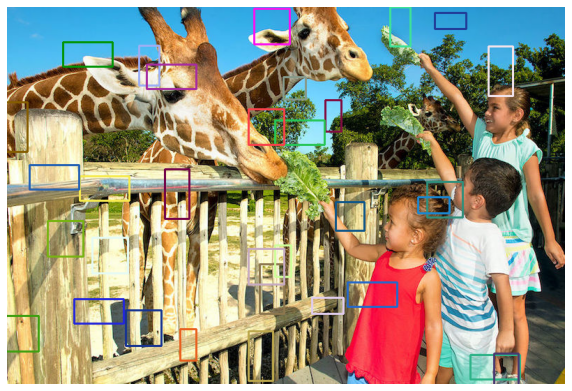

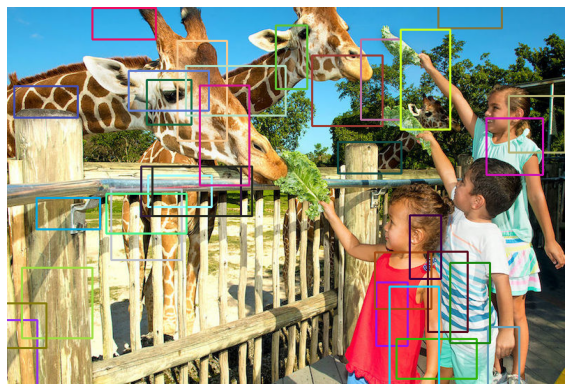

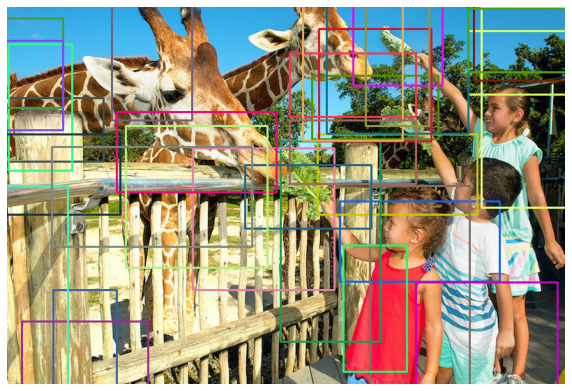

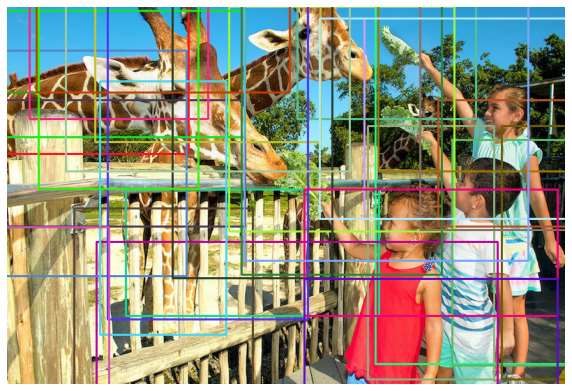

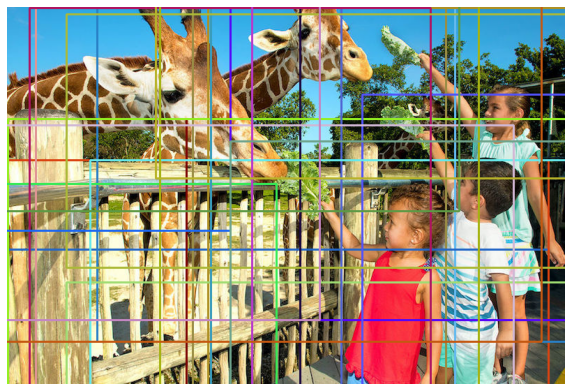

In [14]:
anchors_num_per_level = [61200, 15300, 3825, 1053, 315]
anchors_per_level = np.split(anchors_example, np.cumsum(anchors_num_per_level)[:-1])

num_to_show = 32
for anchor_boxes_level in anchors_per_level:
    image_example_with_anchors = image_example.copy()
    for i in np.random.choice(len(anchor_boxes_level), size=num_to_show):
        anchor_box = anchor_boxes_level[i]
        x1, y1, x2, y2 = anchor_box.numpy().astype(np.int32)
        cv2.rectangle(image_example_with_anchors, (x1, y1), (x2, y2), np.random.randint(255, size=3).tolist(), 2)
    
    show_image(image_example_with_anchors)

Теперь, когда у нас есть модуль для генерации якорных прямоугольников, можем перейти к сеткам для классификации и регрессии на их основе.

---

#### Regression & Classification subnets

Классификацию (объект одного из классов или фон) и регрессию (уточнение координат объекта относительно `anchor box`) будет делать в сверточной манере.

![overall](images/overall.png)

* Регрессия

Поскольку с каждым супер-пикселем у нас ассоциировано 9 разных `proposals`, каждый из которых задан с помощью 4 чисел, то для регрессии нам потребуется 9 x 4 = 36 чисел в каждом суперпикселе. Значит, сделаем полносверточную сеть, которая не меняет размера карт активаций (то есть нет `pooling`-слоев и `stride`=1) и имеет на выходе 36 каналов. Таким образом, в каждом из `HxW` суперпикселей выходной карты будут храниться все необходимые таргеты.

**Задание:** напишите код для преобразования тензора с результатами из вида `B x (num_anchors * 4) x H x W` к виду `B x total_num_anchors x 4`.

In [15]:
class RegressionModel(nn.Module):
    
    def __init__(self, num_features_in, num_anchors=9, feature_size=256):
        """
        RegressionModel consctructor. 
        
        RegressionModel is a fully-convolutional neural network that takes single feature pyramid level and
        outputs tensor of size total_number_of_anchors x 4.
        
        Args:
            - num_features_in: number of channels in every feature pyramid level.
            - num_anchors: size of anchor boxes set.
            - feature_size: size of internal activation maps.
        """
        super(RegressionModel, self).__init__()

        self.conv1 = nn.Conv2d(num_features_in, feature_size, kernel_size=3, padding=1)
        self.act1 = nn.ReLU()

        self.conv2 = nn.Conv2d(feature_size, feature_size, kernel_size=3, padding=1)
        self.act2 = nn.ReLU()

        self.conv3 = nn.Conv2d(feature_size, feature_size, kernel_size=3, padding=1)
        self.act3 = nn.ReLU()

        self.conv4 = nn.Conv2d(feature_size, feature_size, kernel_size=3, padding=1)
        self.act4 = nn.ReLU()

        self.output = nn.Conv2d(feature_size, num_anchors * 4, kernel_size=3, padding=1)

    def forward(self, x):
        """
        Run regression on single feature pyramid level.
        
        Args:
            - x: feature pyramid level of shape B x num_features_in x H x W.
            
        Returns:
            tensor of size B x (H * W * num_anchors) x 4.
        """
        out = self.conv1(x)
        out = self.act1(out)

        out = self.conv2(out)
        out = self.act2(out)

        out = self.conv3(out)
        out = self.act3(out)

        out = self.conv4(out)
        out = self.act4(out)

        out = self.output(out)
        # out is B x C x H x W, with C = 4 * num_anchors
        
        # TODO: change shape of `out` tensor to be `B x total_num_anchors x 4`.
        
        # YOUR CODE HERE
        out = out.permute(0, 2, 3, 1) # B  x H x W x C
        out = out.reshape(out.shape[0], -1, 4) # B  x (H x W x C/4), 4
        # END OF YOUR CODE
        
        return out

In [16]:
num_features_in = 256
regression_head = RegressionModel(num_features_in).to(device)

regression_predictions = []
for features in features_pyramid_example:
    regression_predictions_at_level = regression_head(features)
    regression_predictions.append(regression_predictions_at_level)
    print(f"input: {features.size()}\t output: {regression_predictions_at_level.size()}")
regression_predictions = torch.cat(regression_predictions, dim=1) # batch x anchors x 4 [4 for bbox]

input: torch.Size([1, 256, 68, 100])	 output: torch.Size([1, 61200, 4])
input: torch.Size([1, 256, 34, 50])	 output: torch.Size([1, 15300, 4])
input: torch.Size([1, 256, 17, 25])	 output: torch.Size([1, 3825, 4])
input: torch.Size([1, 256, 9, 13])	 output: torch.Size([1, 1053, 4])
input: torch.Size([1, 256, 5, 7])	 output: torch.Size([1, 315, 4])


* Классификация

Архитектурно голова классификации идентична голове регрессии, отличие только в размере выхода (и активации): модель возвращает столько значений для каждого бокса, сколько классов в датасете, причем с активацией `Sigmoid`.

In [17]:
class ClassificationModel(nn.Module):
    
    def __init__(self, num_features_in, num_anchors=9, num_classes=80, prior=0.01, feature_size=256):
        """
        ClassificationModel consctructor. 
        
        ClassificationModel is a fully-convolutional neural network that takes single feature pyramid level and
        outputs tensor of size total_number_of_anchors x num_classes.
        
        Args:
            - num_features_in: number of channels in every feature pyramid level.
            - num_anchors: size of anchor boxes set.
            - num_classes: number of classes in dataset (do not count the `background` class!).
            - prior: float number to use in weights initializatin.
            - feature_size: size of internal activation maps.
        """
        super(ClassificationModel, self).__init__()

        self.num_classes = num_classes
        self.num_anchors = num_anchors

        self.conv1 = nn.Conv2d(num_features_in, feature_size, kernel_size=3, padding=1)
        self.act1 = nn.ReLU()

        self.conv2 = nn.Conv2d(feature_size, feature_size, kernel_size=3, padding=1)
        self.act2 = nn.ReLU()

        self.conv3 = nn.Conv2d(feature_size, feature_size, kernel_size=3, padding=1)
        self.act3 = nn.ReLU()

        self.conv4 = nn.Conv2d(feature_size, feature_size, kernel_size=3, padding=1)
        self.act4 = nn.ReLU()

        self.output = nn.Conv2d(feature_size, num_anchors * num_classes, kernel_size=3, padding=1)
        self.output_act = nn.Sigmoid()

    def forward(self, x):        
        """
        Run classification on single feature pyramid level.
        
        Args:
            - x: feature pyramid level of shape B x num_features_in x H x W.
            
        Returns:
            tensor of size B x (H * W * num_anchors) x num_classes.
        """
        out = self.conv1(x)
        out = self.act1(out)

        out = self.conv2(out)
        out = self.act2(out)

        out = self.conv3(out)
        out = self.act3(out)

        out = self.conv4(out)
        out = self.act4(out)

        out = self.output(out)
        out = self.output_act(out)
        # out is B x C x W x H, with C = num_classes * num_anchors
        
        out1 = out.permute(0, 2, 3, 1)
        batch_size, width, height, channels = out1.shape
        out2 = out1.reshape(batch_size, width, height, self.num_anchors, self.num_classes)

        return out2.reshape(x.shape[0], -1, self.num_classes)

In [18]:
classification_head = ClassificationModel(num_features_in, num_classes=num_classes).to(device)
classification_results = []

for feature in features_pyramid_example:
    classification_results_at_level = classification_head(feature)
    classification_results.append(classification_results_at_level)
    print(f"input: {feature.size()}\t output: {classification_results_at_level.size()}")
classification_results = torch.cat(classification_results, dim=1) # batch x anchors x classes

input: torch.Size([1, 256, 68, 100])	 output: torch.Size([1, 61200, 80])
input: torch.Size([1, 256, 34, 50])	 output: torch.Size([1, 15300, 80])
input: torch.Size([1, 256, 17, 25])	 output: torch.Size([1, 3825, 80])
input: torch.Size([1, 256, 9, 13])	 output: torch.Size([1, 1053, 80])
input: torch.Size([1, 256, 5, 7])	 output: torch.Size([1, 315, 80])


Теперь мы можем объединить все в одну композицию, класс `RetinaNet`.

---

#### RetinaNet

In [19]:
from retinanet.utils import BBoxTransform, ClipBoxes
from retinanet.losses import FocalLoss
from torchvision.ops import nms

Из интересного: метод `.forward()` работает по разному во время обучения и во время инференса:
- Во время обучения (`self.training = True`) функция возвращает список из двух лоссов - регрессионного и классификационного.
- Во время инференса функция возвращает предсказания: скоры, индексы классов и координаты боксов. 

Также помимо уже разобранных модулей будут использоваться:
- `BBoxTransform`: класс для сборки боксов из предсказаний регрессионной головы и набора якорных боксов.
- `ClipBoxes`: класс для усечения координат боксов при выходе за границы изображения.
- `FocalLoss`: класс для вычисления сложной функции потерь (на самом деле, в нем вычисляются оба лосса - для классификации и для регрессии).
  Внутри него происходит, например, ассоциация GT-боксов с якорными боксами.

In [20]:
class RetinaNet(nn.Module):
    
    def __init__(self, num_classes, backbone="resnet50", fpn_feature_size=256, subnets_feature_size=256, device=None):
        super(RetinaNet, self).__init__()
        
        self.device = device
        if backbone == "resnet50":
            self.backbone = ResNet(num_classes=num_classes, block=Bottleneck, layers_sizes=(3, 4, 6, 3)).to(device)
            self.fpn = PyramidFeatures(512, 1024, 2048, fpn_feature_size).to(device)
            
        else:
            raise NotImplementedError(backbone)
            
        self.regression_head = RegressionModel(num_features_in=fpn_feature_size, feature_size=subnets_feature_size).to(device)
        self.classification_head = ClassificationModel(num_features_in=fpn_feature_size, num_classes=num_classes, feature_size=subnets_feature_size).to(self.device)
        self._init_weights()
        
        self.anchors_generator = AnchorsGenerator(device=device)
        self.transform_bboxes = BBoxTransform(device=device)
        self.clip_bboxes = ClipBoxes()
        self.loss_fn = FocalLoss(device=device)
        

    def forward(self, inputs):
        """
        Apply RetinaNet pipeline to inputs.
        
        Args:
            - inputs: Either (images_batch, annotations) in training mode or images_batch otherwise. 
            images_batch is of shape (B x C x H x W), annotations of shape (B x N x 5) where N is a number of 
            GT boxes and 5 = 4 coords + 1 class label.
        
        Returns:
            Either (classification_loss, regression_loss) in training mode or (scores, nms_class, boxes) otherwise.
        """
        
        if self.training:
            images_batch, annotations = inputs
        else:
            images_batch = inputs
        
        features = self.backbone(images_batch.to(device))
        features_pyramid = self.fpn(features)
        classification_results = torch.cat([self.classification_head(f) for f in features_pyramid], dim=1)
        regression_results = torch.cat([self.regression_head(f) for f in features_pyramid], dim=1)
        
        anchors = self.anchors_generator(images_batch)
        
        if self.training:
            return self.loss_fn(classification_results, regression_results, anchors, annotations)
        
        transformed_anchors = self.transform_bboxes(anchors, regression_results)
        transformed_anchors = self.clip_bboxes(transformed_anchors, images_batch)

        scores = torch.max(classification_results, dim=2, keepdim=True)[0]
        scores_over_thresh = (scores > 0.05)[0, :, 0]

        if scores_over_thresh.sum() == 0:
            # no boxes to NMS, just return
            return [torch.zeros(0), torch.zeros(0), torch.zeros(0, 4)]

        # NMS iteratively removes lower scoring boxes which have an
        # IoU greater than iou_threshold with another (higher scoring) box
        classification_results = classification_results[:, scores_over_thresh, :]
        transformed_anchors = transformed_anchors[:, scores_over_thresh, :]
        scores = scores[:, scores_over_thresh, :]

        anchors_nms_idx = nms(transformed_anchors[0,:,:], scores[0,:,0], 0.5)

        nms_scores, nms_class = classification_results[0, anchors_nms_idx, :].max(dim=1)

        return [nms_scores, nms_class, transformed_anchors[0, anchors_nms_idx, :]]
    
    def _init_weights(self):
        
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                n = m.kernel_size[0] * m.kernel_size[1] * m.out_channels
                m.weight.data.normal_(0, np.sqrt(2. / n))
            elif isinstance(m, nn.BatchNorm2d):
                m.weight.data.fill_(1)
                m.bias.data.zero_()

        prior = 0.01

        self.classification_head.output.weight.data.fill_(0)
        self.classification_head.output.bias.data.fill_(-np.log((1.0 - prior) / prior))

        self.regression_head.output.weight.data.fill_(0)
        self.regression_head.output.bias.data.fill_(0)

Подгрузим веса из оригинального репозитория (модифицированные для нашего класса) и сделаем пробный прогон на тестовом изображении. Веса получены обучением модели на датасете COCO.

In [21]:
retinanet = RetinaNet(num_classes=80, device=device)
retinanet.eval();

In [22]:
with open("./FIXED_coco_resnet_50_map_0_335_state_dict.pt", "rb") as fp:
    state_dict = torch.load(fp, map_location="cpu")
retinanet.load_state_dict(state_dict)

<All keys matched successfully>

Взглянем на результат работы модели на тестовом примере:

In [23]:
def run_and_show(model, image_or_tensor, threshold, class_to_label_map, verbose=False):
    if isinstance(image_or_tensor, np.ndarray):
        tensor = make_tensor(image_or_tensor)
        image = image_or_tensor
    elif isinstance(image_or_tensor, torch.Tensor):
        image = (image_or_tensor.numpy()[0] * 0.25) + 0.5
        tensor = image_or_tensor.permute(0, 3, 1, 2)
    else:
        raise NotImplementedError(type(image_or_tensor))
        
    with torch.no_grad():
        nms_scores, nms_classes, bboxes = model(tensor)
    
    nms_scores = nms_scores.cpu()
    nms_classes = nms_classes.cpu()
    bboxes = bboxes.cpu()
    
    if verbose:
        print(nms_scores.size(), nms_scores[:8])
        print(nms_classes.size(), nms_classes[:8])
        print(bboxes.size(), bboxes[:8])
        
    image_with_predictions = draw_predictions(image, bboxes, nms_scores, nms_classes, class_to_label_map, threshold=threshold)
    show_image(image_with_predictions)

In [24]:
with open("./coco_id_to_name.json", "rt") as fp:
    coco_class_to_label_map = json.load(fp)
coco_class_to_label_map = {int(k) - 1: v for k, v in coco_class_to_label_map.items()}

torch.Size([37]) tensor([0.9233, 0.9152, 0.9048, 0.6975, 0.6942, 0.6544, 0.3873, 0.3595])
torch.Size([37]) tensor([ 0,  0, 23,  0, 23,  0, 23,  0])
torch.Size([37, 4]) tensor([[449.5888, 243.1150, 640.3466, 536.0121],
        [576.0060,  65.7283, 788.5273, 520.0208],
        [  0.0000,   2.5446, 432.3901, 262.7661],
        [593.4430, 188.3436, 734.5757, 538.8124],
        [160.2017,   6.6155, 513.5728, 313.3863],
        [505.8370, 190.7568, 704.4647, 529.6027],
        [  0.0000,  10.8027, 460.2866, 506.0140],
        [676.0553, 136.6648, 793.7506, 534.0099]])


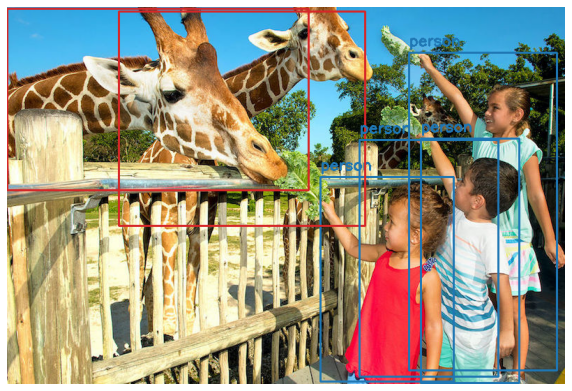

In [25]:
run_and_show(retinanet, image_example, 0.5, coco_class_to_label_map, verbose=True)

---

#### 3. Дообучение RetinaNet

Наконец, убедимся в том, что наша модель может обучаться. 

У нас есть кусок датасета [OpenImages](https://storage.googleapis.com/openimages/web/index.html), которая содержит примеры класса `Ball`.
Будем обучать нашу модель детектировать 1 класс - мячи, шары и т.д.


Подгрузка данных:

In [32]:
!pip install pycocotools

  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
    Preparing wheel metadata: started
    Preparing wheel metadata: finished with status 'done'
  Created wheel for pycocotools: filename=pycocotools-2.0.6-cp38-cp38-win_amd64.whl size=76436 sha256=7bef8a88d210527e8f042c39a37a263e9d5da83c83cfa978697f8db7cf69381e
  Stored in directory: c:\users\asus\appdata\local\pip\cache\wheels\3e\08\ac\58126fe59992032701437336493f6132e1b72381a62d00b595
Successfully built pycocotools


In [33]:
import tqdm

from torchvision import transforms
from torch.utils.data import DataLoader

from dataset import DetectionDataset

from retinanet.dataloader import Normalizer, Resizer, Augmenter, collater, AspectRatioBasedSampler

In [34]:
train_transforms = transforms.Compose([
    Normalizer(), Augmenter(), Resizer()
])

val_transforms = transforms.Compose([
    Normalizer(), Resizer()
])

Теперь к созданию датасетов и даталоадеров.

Обратите внимание на `AspectRatioBasedSampler`: 
* Для обучения моделей в `pytorch` необходимо, чтобы все элементы в батче были одного размера.
* Поскольку мы учим полносверточную архитектуру на полных изображениях (а не на кропах, как в классификации), то нам нужно отресайзить их к одному размеру. 
Если у изображений разное соотношение сторон, мы будем добавлять рамки (padding).
* `AspectRatioBasedSampler` группирует изображения в датасете таким образом, чтобы в батч попадали изображения с как можно более похожим соотношением сторон, чтобы не делать слишком большие паддинги.

Датасеты устроены так, чтобы возвращать тензор изображения и тензор аннотаций к нему.

In [35]:
train_dataset = DetectionDataset(data_dict_file="./oi5_ball_filename_to_bbox_train.json", transforms=train_transforms)
train_sampler = AspectRatioBasedSampler(train_dataset, batch_size=2, drop_last=False) # deepdive
train_dataloader = DataLoader(train_dataset, num_workers=8, collate_fn=collater, batch_sampler=train_sampler)

val_dataset = DetectionDataset(data_dict_file="./oi5_ball_filename_to_bbox_val.json", transforms=val_transforms)
val_sampler = AspectRatioBasedSampler(val_dataset, batch_size=2, drop_last=False)
val_dataloader = DataLoader(val_dataset, num_workers=8, collate_fn=collater, batch_sampler=val_sampler)

In [36]:
item = train_dataset[0]
print(item["img"].size())    # H x W x 3
print(item["annot"].size())  # N x 5; 4 coords + 1 label.

torch.Size([640, 992, 3])
torch.Size([6, 5])


Теперь непосредственно к модели.

Во-первых, нужно заменить головы для классификации и регрессии для дообучения.
При этом у классификационной головы нужно указать число классов - 1.

In [41]:
retinanet.classification_head = ClassificationModel(num_features_in, num_classes=1)
retinanet.regression_head = RegressionModel(num_features_in)
retinanet.to(device);

Во-вторых, потребуется функция для переключения модулей нашей сети в режим обучения; сделаем так, чтобы можно было учить отдельные модули.

**Вопрос**: зачем "замораживать" BN?

In [42]:
def set_to_training(model, backbone=False, fpn=False, regression_head=True, classification_head=True, freeze_bn=False):
    model.train()
    model.requires_grad_(True)
    
    if not backbone:
        model.backbone.eval()
        model.backbone.requires_grad_(False)
    
    elif freeze_bn:
        for layer in model.backbone.modules():
            if isinstance(layer, nn.BatchNorm2d):
                layer.eval()
    
    if not fpn:
        model.fpn.eval()
        model.fpn.requires_grad_(False)
    
    if not regression_head:
        model.regression_head.eval()
        model.regression_head.requires_grad_(False)

    if not classification_head:
        model.classification_head.eval()
        model.classification_head.requires_grad_(False)

И простая функция для обучения на 1 эпохе.

In [43]:
def routine(retina_model, scheduler):
    epoch_loss = []
    
    for iter_num, data in tqdm.tqdm(enumerate(train_dataloader), total=len(train_dataloader)):
        
        optimizer.zero_grad()
        
        classification_loss, regression_loss = retina_model([data['img'].to(device).float(), data['annot'].to(device)])
        classification_loss = classification_loss.mean()
        regression_loss = regression_loss.mean()

        loss = classification_loss + regression_loss

        if bool(loss == 0):
            continue

        loss.backward()
        torch.nn.utils.clip_grad_norm_(retina_model.parameters(), 0.1)
        optimizer.step()

        epoch_loss.append(float(loss))
        if iter_num + 1 ==len(train_dataloader):
            print(
                'Epoch: {} | Iteration: {} | Classification loss: {:1.5f} | Regression loss: {:1.5f} | Epoch loss: {:1.5f}'.format(
                    epoch_num, iter_num, float(classification_loss), float(regression_loss), np.mean(epoch_loss)))
        
    scheduler.step(np.mean(epoch_loss)) # should be val loss
    return data

Сначала обучим только новые головы в течение 1 эпохи:

In [44]:
set_to_training(retinanet, backbone=False, fpn=False, regression_head=True, classification_head=True)

In [45]:
params = [p for p in retinanet.parameters() if p.requires_grad]
optimizer = torch.optim.Adam(params, lr=3e-4)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=3, verbose=True)

In [46]:
epochs = 1
for epoch_num in range(epochs):
    data = routine(retinanet, scheduler)

KeyboardInterrupt: 

И потом обучим всю сеть (с "замороженными" BN) - уже подольше.

In [47]:
set_to_training(retinanet, backbone=True, fpn=True, regression_head=True, classification_head=True, freeze_bn=True)

In [48]:
params = [p for p in retinanet.parameters() if p.requires_grad]
optimizer = torch.optim.Adam(params, lr=3e-4)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=3, verbose=True)

In [ ]:
epochs = 10
for epoch_num in range(epochs):
    routine(retinanet, scheduler)
    
    if epoch_num % 10 == 0 or epoch_num + 1 == epochs:
        torch.save(retinanet.state_dict(), f"dev_balls_retinanet_{epoch_num}.pt")        

Для иллюстрации результатов выберем случайные изображения из выборки и отрисуем предсказания.

In [49]:
with open("oi5_ball_retinanet_ep=10.pt", "rb") as fp:
    state_dict = torch.load(fp, map_location="cpu")
retinanet.load_state_dict(state_dict)

<All keys matched successfully>

In [50]:
retinanet.eval();

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([6]) tensor([0.8534, 0.0623, 0.0593, 0.0591, 0.0543, 0.0502])
torch.Size([6]) tensor([0, 0, 0, 0, 0, 0])
torch.Size([6, 4]) tensor([[247.8516, 365.9282, 398.6130, 515.9979],
        [336.8020, 227.4401, 400.3791, 274.8349],
        [ 14.6620,   0.0000, 537.0565, 832.0000],
        [ 96.5168, 736.0382, 301.9988, 809.6245],
        [239.0545,   0.0000, 611.1486, 715.1937],
        [  4.4392, 316.3378, 430.5196, 817.1348]])


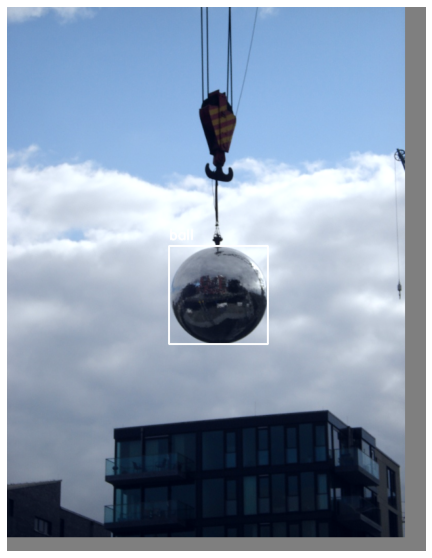

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([5]) tensor([0.9228, 0.1954, 0.0862, 0.0602, 0.0511])
torch.Size([5]) tensor([0, 0, 0, 0, 0])
torch.Size([5, 4]) tensor([[436.5541, 455.7102, 490.9110, 509.5387],
        [141.2299, 190.7744, 230.1635, 289.4145],
        [154.3616, 221.0407, 217.9270, 297.2893],
        [137.3863, 173.1713, 281.9758, 298.3020],
        [827.3663, 401.8778, 855.5751, 437.8134]])


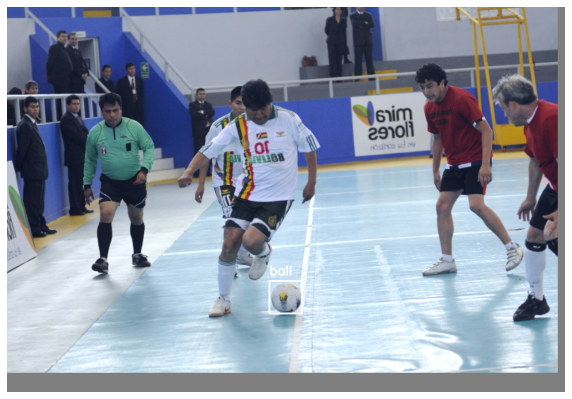

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([7]) tensor([0.7584, 0.1050, 0.0951, 0.0680, 0.0596, 0.0539, 0.0539])
torch.Size([7]) tensor([0, 0, 0, 0, 0, 0, 0])
torch.Size([7, 4]) tensor([[417.3815, 376.2089, 572.1967, 509.1075],
        [224.3032, 351.9115, 344.3042, 462.4305],
        [395.0179, 261.8654, 562.0737, 492.9036],
        [235.3374, 170.7304, 288.8679, 227.7103],
        [571.4766, 412.2161, 684.1564, 532.8859],
        [559.5491, 331.7045, 672.8390, 479.4393],
        [501.5091, 371.4764, 568.3216, 413.4864]])


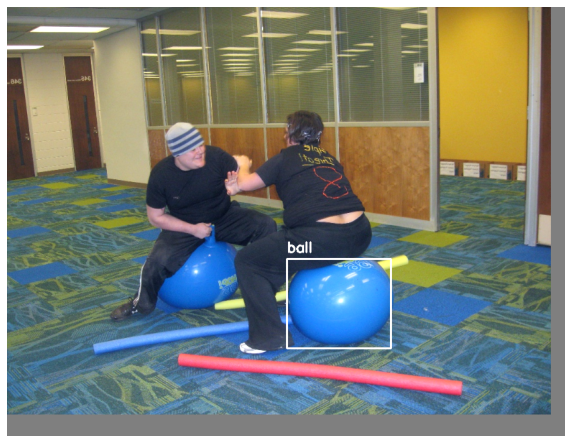

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([34]) tensor([0.8632, 0.7632, 0.5609, 0.3637, 0.2403, 0.1927, 0.1494, 0.1417])
torch.Size([34]) tensor([0, 0, 0, 0, 0, 0, 0, 0])
torch.Size([34, 4]) tensor([[403.0780, 494.6068, 515.8070, 607.5386],
        [346.6789, 244.2164, 436.5123, 336.4018],
        [123.5205,  56.8916, 192.0845, 155.0067],
        [454.1185, 197.4038, 570.1889, 326.1915],
        [  2.8022,  32.0478, 558.8678, 733.8381],
        [  1.9557,   0.0000, 193.1017, 186.5014],
        [313.1133,  24.6244, 420.8303, 176.6448],
        [323.5241, 350.9697, 388.5853, 425.3430]])


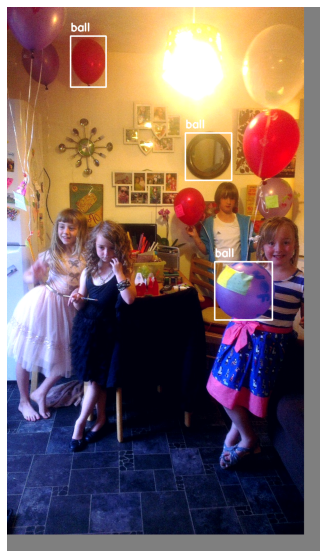

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([12]) tensor([0.9019, 0.1600, 0.0868, 0.0811, 0.0762, 0.0690, 0.0659, 0.0639])
torch.Size([12]) tensor([0, 0, 0, 0, 0, 0, 0, 0])
torch.Size([12, 4]) tensor([[260.2769, 363.7067, 315.3698, 419.8350],
        [105.8007, 256.3585, 233.8315, 392.9834],
        [545.3306, 319.8276, 574.5654, 347.0390],
        [ 33.0371, 258.0320, 255.4739, 432.8579],
        [704.8821, 258.4406, 799.2725, 357.6001],
        [590.3029,   6.2592, 874.2584, 123.6108],
        [ 92.9120, 283.4464, 243.9048, 485.8956],
        [243.1667, 302.0099, 337.7070, 421.7479]])


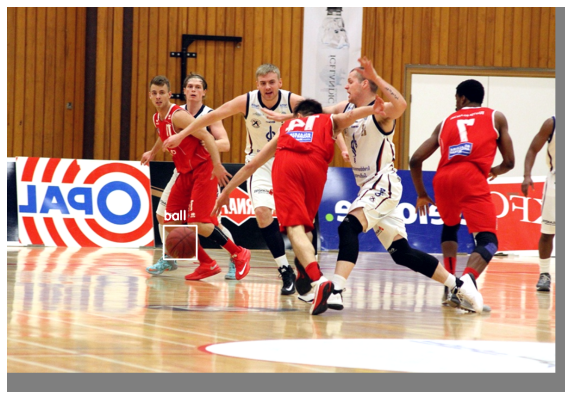

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([39]) tensor([0.6639, 0.6105, 0.5544, 0.3693, 0.3511, 0.2109, 0.1778, 0.1638])
torch.Size([39]) tensor([0, 0, 0, 0, 0, 0, 0, 0])
torch.Size([39, 4]) tensor([[606.8879, 338.4229, 762.5787, 498.3511],
        [558.5403, 100.7884, 800.1013, 513.2671],
        [  7.8541,  84.8255, 345.1505, 470.4772],
        [176.1570, 268.3616, 305.7726, 415.2218],
        [117.4041, 284.6522, 152.7454, 329.5592],
        [141.7922, 149.6618, 421.1711, 445.1846],
        [536.7767, 110.5097, 658.2551, 208.2254],
        [566.1115, 102.4395, 818.6307, 204.3978]])


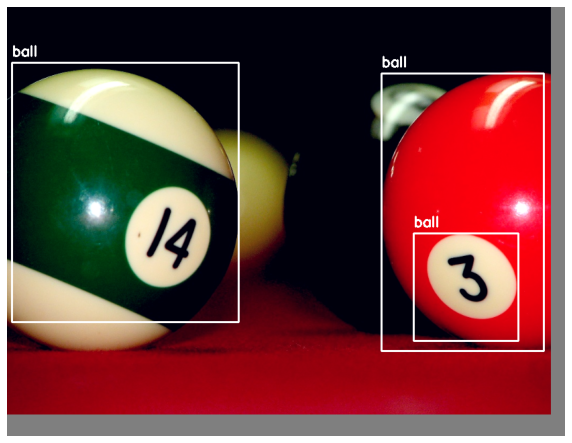

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([2]) tensor([0.4877, 0.0641])
torch.Size([2]) tensor([0, 0])
torch.Size([2, 4]) tensor([[704.9095, 289.7966, 774.6295, 361.7486],
        [694.0421, 287.2928, 756.6844, 340.4386]])


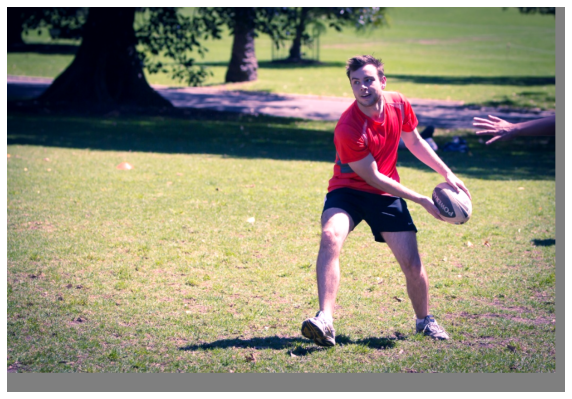

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([61]) tensor([0.7172, 0.2238, 0.1458, 0.1441, 0.1325, 0.1192, 0.1187, 0.1118])
torch.Size([61]) tensor([0, 0, 0, 0, 0, 0, 0, 0])
torch.Size([61, 4]) tensor([[  0.0000, 216.3548, 568.8009, 607.7722],
        [390.2324, 212.3359, 436.8862, 259.7880],
        [  0.0000, 201.2396, 257.9914, 356.1566],
        [ 13.2569, 222.1960,  64.9819, 254.4071],
        [564.5113, 237.2569, 605.0168, 268.8617],
        [  4.4639, 290.3821, 170.3647, 479.9054],
        [402.7718, 491.6471, 571.5521, 602.6740],
        [ 81.2002, 205.8517, 139.0475, 259.2012]])


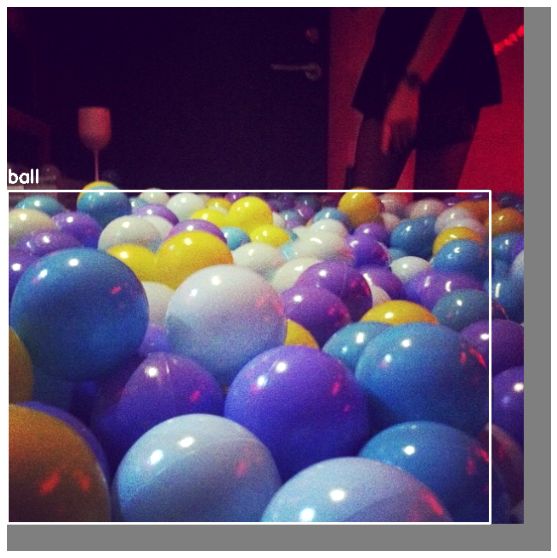

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([24]) tensor([0.5847, 0.5695, 0.4652, 0.3669, 0.1910, 0.1214, 0.1002, 0.0852])
torch.Size([24]) tensor([0, 0, 0, 0, 0, 0, 0, 0])
torch.Size([24, 4]) tensor([[310.3540, 321.8014, 482.6453, 500.5873],
        [311.9629, 139.6215, 485.8330, 319.1495],
        [646.3077,   5.9385, 814.3102, 203.4437],
        [492.4907, 169.8062, 675.3428, 349.6426],
        [277.0453, 325.7188, 318.3208, 369.8261],
        [ 19.1903,  17.3214, 716.2841, 539.4224],
        [328.0983, 134.6330, 652.4197, 400.3286],
        [275.9610,   5.6622, 763.0175, 424.5235]])


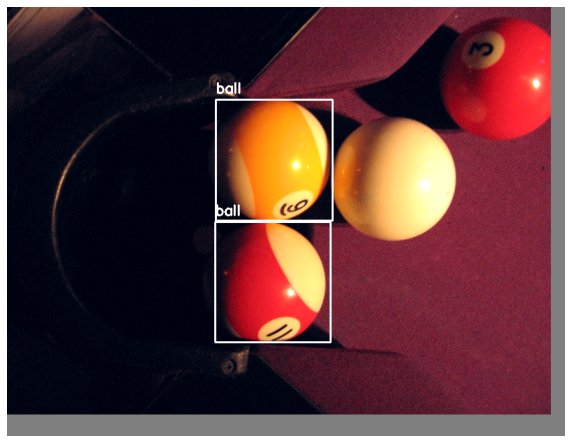

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3]) tensor([0.0761, 0.0622, 0.0592])
torch.Size([3]) tensor([0, 0, 0])
torch.Size([3, 4]) tensor([[162.3347, 168.0356, 314.6931, 261.9341],
        [134.6918, 168.2365, 183.6976, 220.1782],
        [133.2788, 146.4831, 395.2802, 275.2636]])


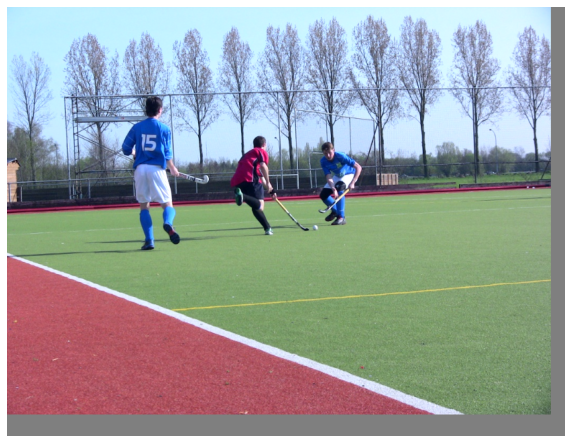

In [51]:
for i in range(10):
    index = np.random.randint(len(train_dataset))
    tensor = train_dataset[index]["img"].unsqueeze(0)
    run_and_show(retinanet, tensor, 0.5, {0: "ball"}, verbose=True)

Пример из валидации:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([12]) tensor([0.9479, 0.1943, 0.1124, 0.1059, 0.0915, 0.0856, 0.0723, 0.0582])
torch.Size([12]) tensor([0, 0, 0, 0, 0, 0, 0, 0])
torch.Size([12, 4]) tensor([[563.8993, 499.3624, 666.5978, 603.9814],
        [477.1276, 197.1874, 578.4324, 302.8086],
        [554.2374, 370.6507, 676.4456, 513.7863],
        [  0.0000,   0.0000, 167.8131, 301.7114],
        [  2.8781, 588.5897,  44.7753, 607.0760],
        [388.0054, 292.1057, 518.2123, 410.3046],
        [251.9161,   2.4033, 330.4498,  49.3871],
        [271.7366, 185.6384, 795.5189, 602.2236]])


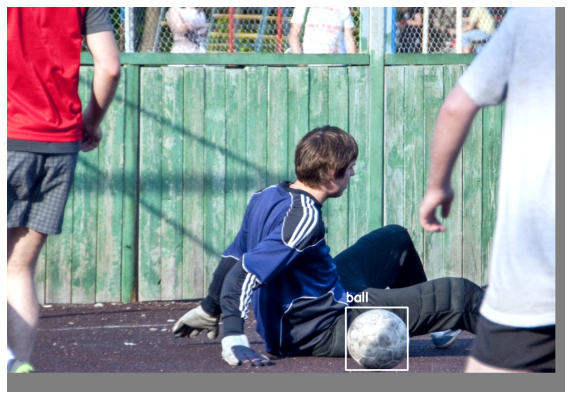

torch.Size([28]) tensor([0.3920, 0.3806, 0.3641, 0.2016, 0.1249, 0.1234, 0.1204, 0.1191])
torch.Size([28]) tensor([0, 0, 0, 0, 0, 0, 0, 0])
torch.Size([28, 4]) tensor([[476.6940, 509.9793, 572.7349, 564.5593],
        [519.4443, 511.2995, 581.6763, 561.1234],
        [449.4910, 513.7529, 514.5103, 563.6184],
        [262.1000, 451.1940, 375.6425, 566.7017],
        [417.0638, 507.3239, 526.3081, 570.6566],
        [512.5142, 496.7801, 613.1246, 580.9139],
        [420.5133, 496.3849, 606.7920, 570.8521],
        [486.3223, 498.3186, 563.7480, 544.8742]])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


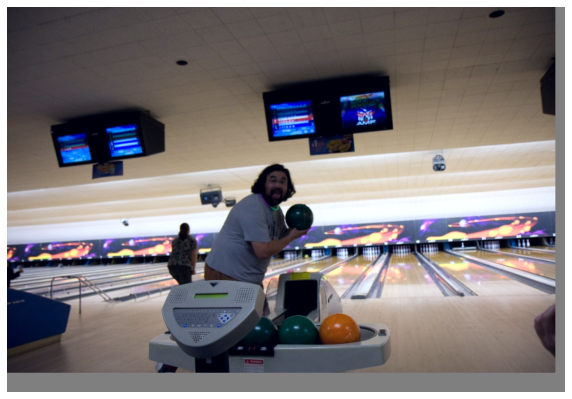

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([18]) tensor([0.2091, 0.1353, 0.1255, 0.0971, 0.0919, 0.0782, 0.0673, 0.0667])
torch.Size([18]) tensor([0, 0, 0, 0, 0, 0, 0, 0])
torch.Size([18, 4]) tensor([[ 739.8268,   73.2839,  825.7088,  166.4519],
        [ 114.5318,  168.4349,  207.1671,  285.0537],
        [ 896.9160,  240.5815, 1010.5500,  541.5554],
        [ 184.1019,  157.5154,  341.6800,  290.2468],
        [ 518.7012,  189.1500,  616.0396,  284.0259],
        [   0.0000,  116.3491,  922.1788,  542.2722],
        [ 115.3126,  150.9144,  337.8882,  336.7296],
        [   9.3997,  141.7629,  354.9153,  556.9657]])


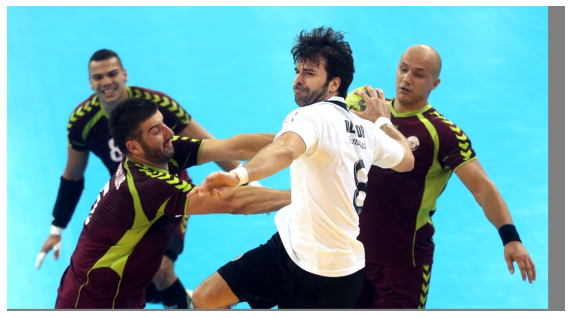

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([10]) tensor([0.8416, 0.6766, 0.1434, 0.0995, 0.0908, 0.0871, 0.0813, 0.0598])
torch.Size([10]) tensor([0, 0, 0, 0, 0, 0, 0, 0])
torch.Size([10, 4]) tensor([[111.5104, 249.0332, 339.5150, 501.2623],
        [350.0193,  84.0202, 647.0091, 409.9326],
        [156.8546,  84.4016, 645.3606, 500.1517],
        [251.9373,  59.5504, 555.2700, 391.1724],
        [148.3666, 219.2204, 441.7294, 476.8340],
        [279.8081, 158.2903, 605.6854, 454.5419],
        [  1.4635, 111.6593, 478.0264, 568.9933],
        [110.6306,  13.0143, 447.0036, 310.1093]])


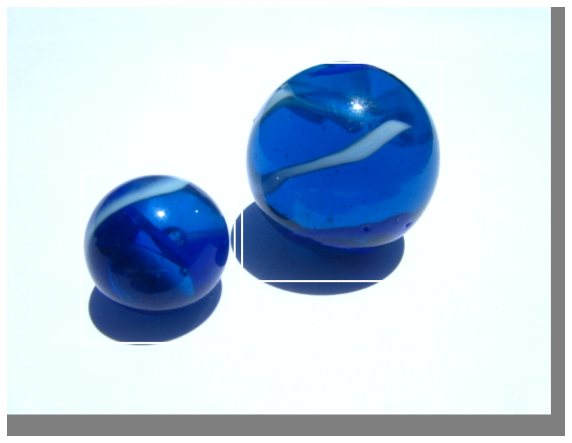

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([19]) tensor([0.3867, 0.2140, 0.1241, 0.1030, 0.1025, 0.0946, 0.0902, 0.0816])
torch.Size([19]) tensor([0, 0, 0, 0, 0, 0, 0, 0])
torch.Size([19, 4]) tensor([[851.5589, 516.8839, 892.6771, 570.7931],
        [150.2046, 125.2761, 226.3653, 156.9449],
        [124.8921, 123.0771, 235.8990, 235.7186],
        [ 24.1778, 159.5602, 158.3390, 301.8745],
        [481.8782, 529.1561, 531.6516, 566.4236],
        [518.4531, 521.1920, 545.3141, 554.5719],
        [ 32.1106, 129.9652, 243.5301, 310.0980],
        [470.8966, 501.5652, 541.3156, 567.8242]])


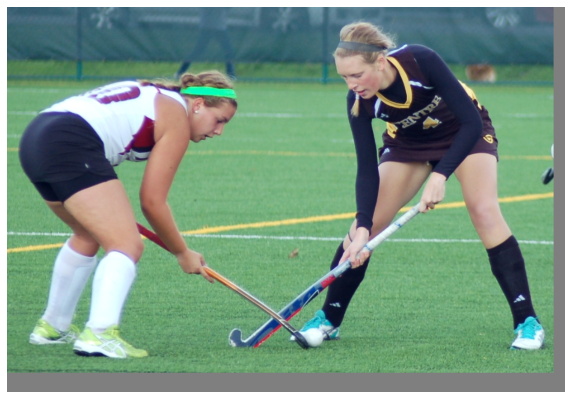

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([14]) tensor([0.9337, 0.1645, 0.0828, 0.0819, 0.0648, 0.0638, 0.0597, 0.0592])
torch.Size([14]) tensor([0, 0, 0, 0, 0, 0, 0, 0])
torch.Size([14, 4]) tensor([[359.0827, 273.7775, 453.1348, 369.5611],
        [733.1591, 537.4933, 815.4012, 605.6045],
        [209.8741, 329.6949, 263.9924, 370.3772],
        [721.9296, 421.5478, 773.3768, 478.4350],
        [116.3424, 116.9534, 146.6256, 148.5555],
        [126.6663, 507.8675, 189.0327, 583.4181],
        [457.5182, 252.3564, 522.8719, 364.3069],
        [ 23.0349, 222.3446, 545.1324, 587.0977]])


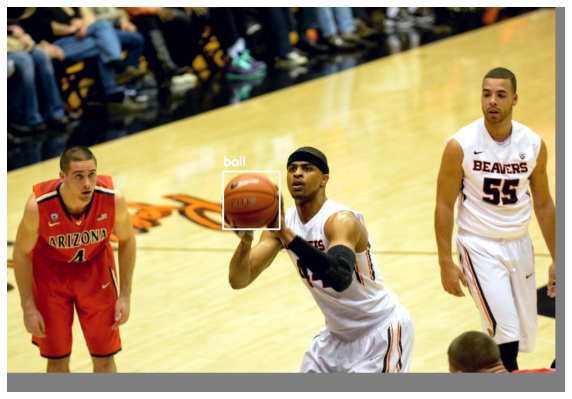

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([12]) tensor([0.3717, 0.1978, 0.1127, 0.1009, 0.0807, 0.0671, 0.0646, 0.0607])
torch.Size([12]) tensor([0, 0, 0, 0, 0, 0, 0, 0])
torch.Size([12, 4]) tensor([[359.8986, 277.5764, 413.7831, 330.9373],
        [747.3091, 348.3647, 772.8322, 376.4657],
        [310.0367, 220.9334, 379.5588, 298.7291],
        [576.2856, 280.9283, 711.6721, 355.9698],
        [329.7957, 262.6818, 414.6232, 324.8184],
        [869.4634,  41.0015, 898.8889,  71.5041],
        [532.0414, 276.5591, 619.7889, 324.5179],
        [325.9110, 221.7617, 367.6490, 276.6164]])


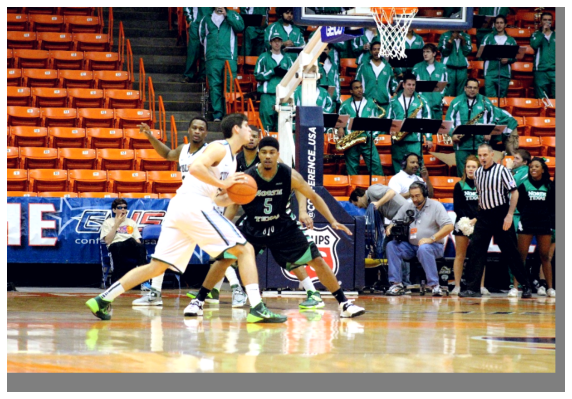

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([15]) tensor([0.9548, 0.9003, 0.8782, 0.5123, 0.3332, 0.1316, 0.1067, 0.0888])
torch.Size([15]) tensor([0, 0, 0, 0, 0, 0, 0, 0])
torch.Size([15, 4]) tensor([[322.4474,  44.9206, 439.5758, 163.9810],
        [458.9704, 209.9792, 651.0042, 400.8296],
        [ 50.7102, 314.7321, 299.2524, 569.6789],
        [639.6937, 180.0655, 824.4805, 362.9411],
        [533.9530, 192.5956, 800.1282, 384.8788],
        [  0.0000,  59.0853, 928.0000, 565.5739],
        [555.6819, 313.5193, 622.3774, 380.0020],
        [  0.0000, 243.9938, 580.9043, 607.8516]])


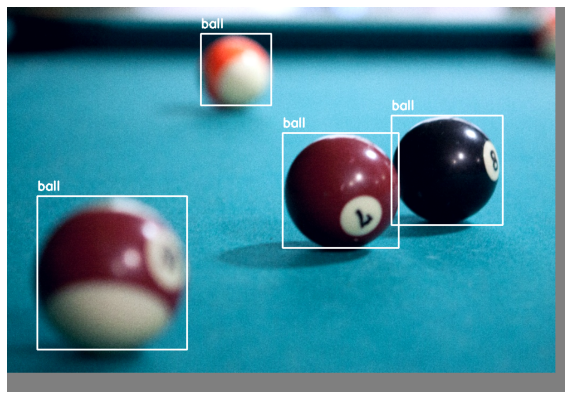

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([39]) tensor([0.4174, 0.3826, 0.2716, 0.2597, 0.2332, 0.2162, 0.1432, 0.1051])
torch.Size([39]) tensor([0, 0, 0, 0, 0, 0, 0, 0])
torch.Size([39, 4]) tensor([[611.8225, 223.5383, 659.9454, 272.9256],
        [  0.0000,  17.5360, 685.8735, 602.7074],
        [408.7151, 493.1770, 517.7072, 607.6727],
        [477.2190, 426.7505, 594.9814, 539.6826],
        [226.4710,  91.7369, 570.6213, 484.2097],
        [221.9046,   0.0000, 784.9073, 504.1992],
        [116.5585, 276.1643, 630.8446, 598.0526],
        [422.3095, 464.2088, 562.4406, 598.6053]])


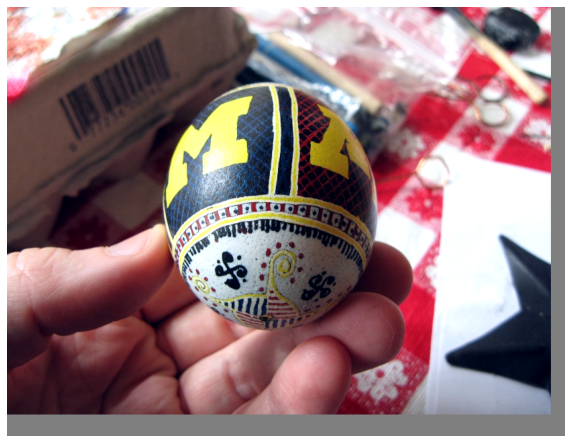

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([4]) tensor([0.9410, 0.5340, 0.0556, 0.0513])
torch.Size([4]) tensor([0, 0, 0, 0])
torch.Size([4, 4]) tensor([[679.5385, 244.9219, 719.6588, 287.9084],
        [453.5015, 266.4030, 492.2946, 306.0163],
        [448.9428, 265.9246, 514.3639, 312.9725],
        [665.9950, 241.9086, 749.8446, 287.5118]])


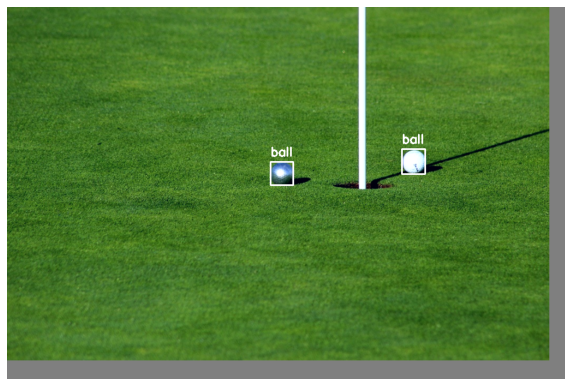

In [52]:
for i in range(10):
    index = np.random.randint(len(val_dataset))
    tensor = val_dataset[index]["img"].unsqueeze(0)
    run_and_show(retinanet, tensor, 0.5, {0: "ball"}, verbose=True)

### Резюме

Если бы мы учили детектор для какой-то конкретной задачи, то:

1. Сделали бы грамотную валидацию (с подсчетом метрик типа `mAP`)
2. Учились бы на нескольких `GPU` (для адекватного размера батча)
3. Более аккуратно подбирали якорные боксы
4. По возможности использовали библиотечные модели (а не кустарные)